# Giga Ranger — Ranging Bias Analysis

**Bench:** Alpha → SMA → 1 m RG-316 → attenuators → Chimp (coax only, no free space).

Signal travels at `VF × c` in the cable, so a 1 m physical cable appears as
`CABLE_M / VF ≈ 1.44 m` to a ToF ranging system using free-space speed of light.

| Term | Definition |
|---|---|
| `raw_m` | SX1280 ranging result (metres) |
| `ELEC_M` | Expected result from cable geometry alone: `CABLE_M / VF` |
| `chip_bias` | `raw_m − ELEC_M` — SX1280 chip offset at this signal level |

Click legend items to toggle traces · box-select or scroll to zoom · double-click to reset.


In [10]:
# ── Configuration ─────────────────────────────────────────────────────────────
# Point DATA_FILE at either:
#   • a raw terminal log (.txt) containing a RANGING_INFO CSV block, OR
#   • any clean CSV with at least: t_ms, raw_m  (extra columns auto-analysed)
#
# On-disk examples:
#   "Assets/gain_sweep_20260721_025644_samples.csv"   (11-col gain-sweep run)
#   "Assets/ranging_session.txt"                       (18-col manual RANGING_INFO run)

DATA_FILE      = "Assets/gain_sweep_20260721_025644_samples.csv"
ROLLING_WINDOW = 50       # points for rolling mean / percentile band
SNR_BIN_WIDTH  = 0.5      # dB per bin for bias-vs-SNR scatter

# ── Bench geometry ─────────────────────────────────────────────────────────────
CABLE_M = 1.0    # physical cable length (metres)
VF      = 0.695  # RG-316 velocity factor (from bench_calibration CSV comment)
# Expected SX1280 reading from cable alone (no chip bias):
#   signal travels at VF×c → apparent length = CABLE_M / VF
ELEC_M  = CABLE_M / VF
print(f"Expected electrical length: {CABLE_M:.3f} m / {VF} = {ELEC_M:.4f} m")
print(f"chip_bias = raw_m − {ELEC_M:.4f} m")


Expected electrical length: 1.000 m / 0.695 = 1.4388 m
chip_bias = raw_m − 1.4388 m


In [11]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import re, io
from pathlib import Path

# ── Columns that are always zero / garbage in ranging mode ────────────────────
_SKIP = {
    'freq_err_hz', 'chimp_rssi_corr_dbm', 'chimp_freq_err_hz',  # always 0
    'snr_db', 'chimp_snr_db',                                     # garbage (-29 dB)
    'rssi_sync', 'inst_rssi_dbm',                                  # constant clones
    'chimp_inst_rssi_dbm', 'chimp_rssi_sync_dbm',
}

def _load_raw_log(text: str) -> pd.DataFrame:
    """Parse terminal log with RANGING_INFO CSV block (handles # comment lines)."""
    header, rows = None, []
    for line in text.splitlines():
        s = line.strip()
        if not s or s.startswith('#') or s.startswith('---'):
            continue
        if s.startswith('t_ms,'):
            header, rows = s, []
        elif header and re.match(r'^\d+,', s):
            rows.append(s)
    if header is None:
        raise ValueError("No 't_ms,...' header found in file")
    return pd.read_csv(io.StringIO(header + '\n' + '\n'.join(rows)))

def load(path: str) -> pd.DataFrame:
    text = Path(path).read_text()
    try:
        df = _load_raw_log(text)
    except ValueError:
        df = pd.read_csv(io.StringIO(text), comment='#')
    df['t_s']        = df['t_ms'] / 1000.0
    df['t_min']      = df['t_ms'] / 60000.0
    df['chip_bias']  = df['raw_m'] - ELEC_M   # SX1280 offset after removing cable delay
    return df

def varying(df: pd.DataFrame) -> list[str]:
    """Non-constant, non-zero columns (excl. time and derived cols)."""
    skip = _SKIP | {'t_ms', 't_s', 't_min', 'pass_num', 'kept', 'chip_bias'}
    out = []
    for c in df.columns:
        if c in skip:
            continue
        v = df[c].dropna()
        if len(v) == 0 or v.nunique() <= 1 or (v == 0).all():
            continue
        out.append(c)
    return out

df   = load(DATA_FILE)
VARY = varying(df)
t0, t1 = df['t_s'].iloc[0], df['t_s'].iloc[-1]
print(f"Loaded {len(df):,} rows  |  {t1-t0:.1f} s = {(t1-t0)/60:.1f} min")
print(f"Varying columns: {VARY}")


Loaded 19,500 rows  |  362.3 s = 6.0 min
Varying columns: ['gain_set', 'raw_m', 'die_c', 'amb_c', 'rssi_dbm', 'gain_step']


In [12]:
# ── Statistics ────────────────────────────────────────────────────────────────
m  = df['raw_m']
cb = df['chip_bias']   # = raw_m - ELEC_M
μ,  σ  = m.mean(),  m.std()
μb, σb = cb.mean(), cb.std()

print(f"  Cable geometry: {CABLE_M:.3f} m physical  /  VF {VF}  =  {ELEC_M:.4f} m electrical")
print()
print(f"  {'':30s}  {'raw_m':>10s}   {'chip_bias':>10s}")
print(f"  {'':30s}  {'(SX1280 result)':>10s}   {'(raw_m − ELEC_M)':>10s}")
print(f"  {'-'*60}")
print(f"  {'N':30s}  {len(m):>10,}   {len(cb):>10,}")
print(f"  {'Mean':30s}  {μ:>+10.4f} m  {μb:>+10.4f} m")
print(f"  {'Median':30s}  {m.median():>+10.4f} m  {cb.median():>+10.4f} m")
print(f"  {'Std dev σ':30s}  {σ:>10.4f} m  {σb:>10.4f} m")
print(f"  {'95% range [2.5–97.5 pct]':30s}  [{m.quantile(.025):+.3f}, {m.quantile(.975):+.3f}] m"
      f"   [{cb.quantile(.025):+.3f}, {cb.quantile(.975):+.3f}] m")
print(f"  {'[min, max]':30s}  [{m.min():+.4f}, {m.max():+.4f}] m"
      f"   [{cb.min():+.4f}, {cb.max():+.4f}] m")


  Cable geometry: 1.000 m physical  /  VF 0.695  =  1.4388 m electrical

                                       raw_m    chip_bias
                                  (SX1280 result)   (raw_m − ELEC_M)
  ------------------------------------------------------------
  N                                   19,500       19,500
  Mean                               +2.8868 m     +1.4480 m
  Median                             +3.3128 m     +1.8740 m
  Std dev σ                           2.2795 m      2.2795 m
  95% range [2.5–97.5 pct]        [-2.592, +5.566] m   [-4.030, +4.128] m
  [min, max]                      [-31.3927, +17.8711] m   [-32.8315, +16.4323] m


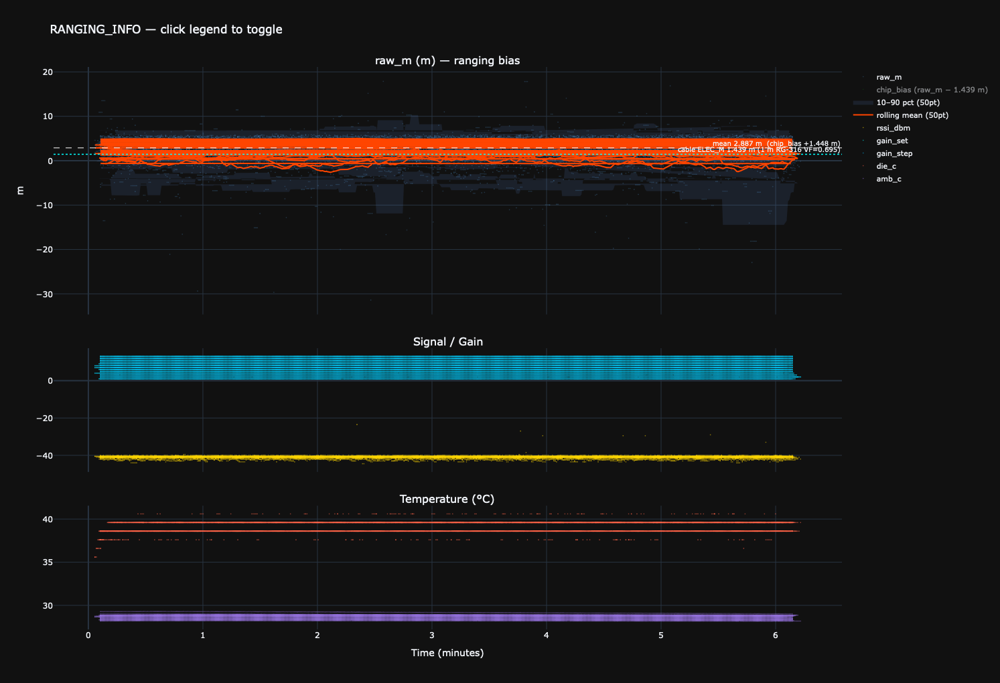

In [13]:
# ── Time series — raw_m with rolling stats, plus all varying signals ──────────
SNR_COLS  = [c for c in ['lora_snr_db'] if c in VARY]
RSSI_COLS = [c for c in ['rssi_dbm', 'lora_rssi_dbm'] if c in VARY]
TEMP_COLS = [c for c in ['die_c', 'amb_c'] if c in VARY]
GAIN_COLS = [c for c in ['gain_set', 'gain_step'] if c in VARY]
OTHER     = [c for c in VARY if c not in
             ['raw_m'] + SNR_COLS + RSSI_COLS + TEMP_COLS + GAIN_COLS]

n_sub   = 1 + bool(SNR_COLS or RSSI_COLS or GAIN_COLS) + bool(TEMP_COLS)
heights = [0.5] + [0.25] * (n_sub - 1)
titles  = (["raw_m (m) — ranging bias"]
           + (["Signal / Gain"] if (SNR_COLS or RSSI_COLS or GAIN_COLS) else [])
           + (["Temperature (°C)"] if TEMP_COLS else []))

fig = make_subplots(rows=n_sub, cols=1, shared_xaxes=True,
    subplot_titles=titles, vertical_spacing=0.06, row_heights=heights)

# raw_m scatter
fig.add_trace(go.Scatter(x=df['t_min'], y=df['raw_m'],
    mode='markers', marker=dict(size=2, color='steelblue', opacity=0.3),
    name='raw_m'), row=1, col=1)

# chip_bias scatter (raw_m shifted down by ELEC_M)
fig.add_trace(go.Scatter(x=df['t_min'], y=df['chip_bias'],
    mode='markers', marker=dict(size=2, color='lime', opacity=0.2),
    name=f'chip_bias (raw_m − {ELEC_M:.3f} m)', visible='legendonly'), row=1, col=1)

# rolling band + mean on raw_m
rb = df['raw_m'].rolling(ROLLING_WINDOW, center=True)
fig.add_trace(go.Scatter(
    x=pd.concat([df['t_min'], df['t_min'].iloc[::-1]]),
    y=pd.concat([rb.quantile(.9), rb.quantile(.1).iloc[::-1]]),
    fill='toself', fillcolor='rgba(100,149,237,0.12)',
    line=dict(color='rgba(0,0,0,0)'),
    name=f'10–90 pct ({ROLLING_WINDOW}pt)'), row=1, col=1)
fig.add_trace(go.Scatter(x=df['t_min'], y=rb.mean(),
    mode='lines', line=dict(color='orangered', width=2),
    name=f'rolling mean ({ROLLING_WINDOW}pt)'), row=1, col=1)

# reference lines
fig.add_hline(y=ELEC_M, line_dash='dot', line_color='cyan', line_width=1.5,
    annotation_text=f'cable ELEC_M {ELEC_M:.3f} m (1 m RG-316 VF={VF})',
    annotation_font_size=10, row=1, col=1)
fig.add_hline(y=μ, line_dash='dash', line_color='white', line_width=1,
    annotation_text=f'mean {μ:.3f} m  (chip_bias {μb:+.3f} m)',
    annotation_font_size=10, row=1, col=1)

row2 = 2
if SNR_COLS or RSSI_COLS or GAIN_COLS:
    CLRS = {'lora_snr_db':'lime','rssi_dbm':'gold','lora_rssi_dbm':'goldenrod',
            'gain_set':'cyan','gain_step':'deepskyblue'}
    for c in SNR_COLS + RSSI_COLS + GAIN_COLS:
        fig.add_trace(go.Scatter(x=df['t_min'], y=df[c],
            mode='markers', marker=dict(size=2, color=CLRS.get(c,'white'), opacity=0.5),
            name=c), row=row2, col=1)
    row2 += 1

if TEMP_COLS:
    for c, clr in zip(TEMP_COLS, ['tomato', 'mediumpurple']):
        fig.add_trace(go.Scatter(x=df['t_min'], y=df[c],
            mode='markers', marker=dict(size=2, color=clr, opacity=0.5),
            name=c), row=row2, col=1)

fig.update_xaxes(title_text='Time (minutes)', row=n_sub, col=1)
fig.update_yaxes(title_text='m', row=1, col=1)
fig.update_layout(title='RANGING_INFO — click legend to toggle',
    height=180 + 280*n_sub, template='plotly_dark',
    legend=dict(x=1.01, y=1, xanchor='left', font=dict(size=11)))
fig.show()


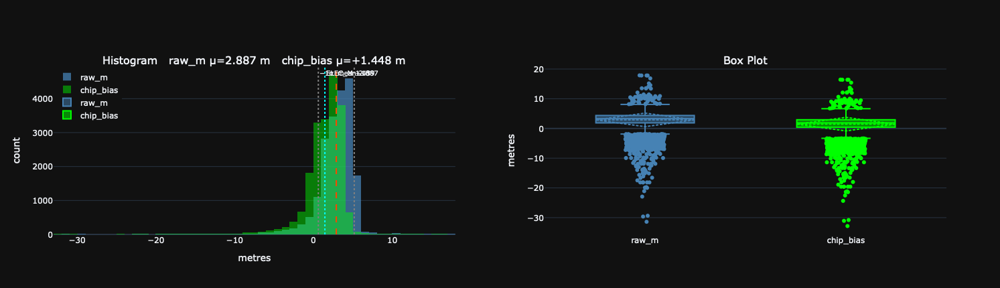

In [14]:
# ── Distribution — histogram + box ────────────────────────────────────────────
fig = make_subplots(rows=1, cols=2,
    subplot_titles=[f'Histogram   raw_m μ={μ:.3f} m   chip_bias μ={μb:+.3f} m',
                    'Box Plot'])

fig.add_trace(go.Histogram(x=df['raw_m'], nbinsx=80,
    marker_color='steelblue', opacity=0.75, name='raw_m'), row=1, col=1)
fig.add_trace(go.Histogram(x=df['chip_bias'], nbinsx=80,
    marker_color='lime', opacity=0.45, name='chip_bias'), row=1, col=1)

for xv, lbl, dash, clr in [
    (ELEC_M,  f'ELEC_M {ELEC_M:.3f}',  'dot',  'cyan'),
    (μ,       f'mean {μ:.3f}',          'dash', 'orangered'),
    (μ+σ,     f'+1σ',                   'dot',  'grey'),
    (μ-σ,     f'−1σ',                   'dot',  'grey'),
]:
    fig.add_vline(x=xv, line_dash=dash, line_color=clr,
        annotation_text=lbl, annotation_font_size=10, row=1, col=1)

fig.add_trace(go.Box(y=df['raw_m'],    name='raw_m',
    marker_color='steelblue', boxmean='sd', boxpoints='outliers', jitter=0.4), row=1, col=2)
fig.add_trace(go.Box(y=df['chip_bias'], name='chip_bias',
    marker_color='lime',      boxmean='sd', boxpoints='outliers', jitter=0.4), row=1, col=2)

fig.update_xaxes(title_text='metres', row=1, col=1)
fig.update_yaxes(title_text='count',  row=1, col=1)
fig.update_yaxes(title_text='metres', row=1, col=2)
fig.update_layout(height=430, template='plotly_dark',
    barmode='overlay', legend=dict(x=0, y=1, xanchor='left'))
fig.show()


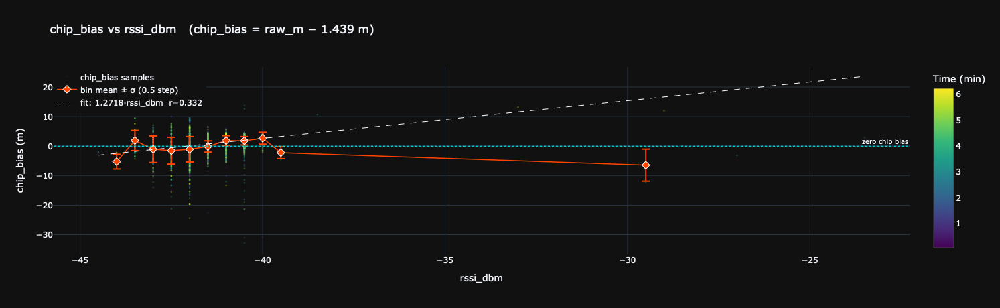

rssi_dbm: chip_bias slope=1.2718 m/unit   r=0.3317


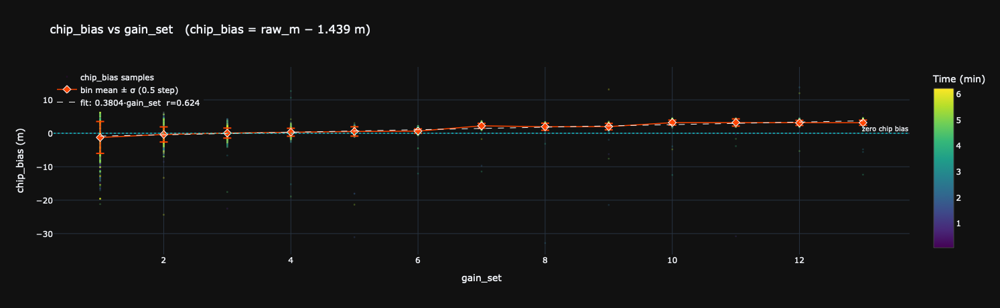

gain_set: chip_bias slope=0.3804 m/unit   r=0.6244


In [15]:
# ── Bias vs signal strength (SNR / RSSI / gain_set) ──────────────────────────
SIG_COLS = ([c for c in ['lora_snr_db'] if c in VARY]
          + [c for c in ['rssi_dbm', 'gain_set'] if c in VARY])

if not SIG_COLS:
    print("No signal-strength column found — skipping")
else:
    for sig in SIG_COLS:
        valid = df[[sig, 'raw_m', 't_min']].dropna()
        fig   = go.Figure()

        valid['chip_bias'] = valid['raw_m'] - ELEC_M

        # scatter coloured by time (chip_bias on y — the quantity we want to calibrate)
        fig.add_trace(go.Scatter(
            x=valid[sig], y=valid['chip_bias'],
            mode='markers',
            marker=dict(size=3, opacity=0.3,
                        color=valid['t_min'], colorscale='Viridis',
                        showscale=True,
                        colorbar=dict(title='Time (min)', x=1.02)),
            name='chip_bias samples'))

        # binned mean ± σ of chip_bias
        if valid[sig].nunique() > 5:
            edges = np.arange(valid[sig].min() - SNR_BIN_WIDTH/2,
                              valid[sig].max() + SNR_BIN_WIDTH, SNR_BIN_WIDTH)
            bstat = valid.groupby(pd.cut(valid[sig], bins=edges), observed=True)['chip_bias']\
                        .agg(['mean','std','count'])
            bstat = bstat[bstat['count'] >= 3]
            bctrs = [iv.mid for iv in bstat.index]
            fig.add_trace(go.Scatter(
                x=bctrs, y=bstat['mean'],
                error_y=dict(type='data', array=bstat['std'].tolist(),
                             visible=True, color='orangered', thickness=2, width=6),
                mode='markers+lines',
                marker=dict(size=9, color='orangered', symbol='diamond',
                            line=dict(width=1, color='white')),
                line=dict(color='orangered', width=1.5),
                name=f'bin mean ± σ ({SNR_BIN_WIDTH:.1f} step)'))
        else:
            bstat = valid.groupby(sig)['chip_bias'].agg(['mean','std','count'])
            fig.add_trace(go.Scatter(
                x=bstat.index, y=bstat['mean'],
                error_y=dict(type='data', array=bstat['std'].tolist(),
                             visible=True, color='orangered', thickness=2, width=6),
                mode='markers+lines',
                marker=dict(size=10, color='orangered', symbol='diamond'),
                line=dict(color='orangered', width=2),
                name='mean ± σ per level'))

        # linear fit on chip_bias
        z = np.polyfit(valid[sig], valid['chip_bias'], 1)
        r = np.corrcoef(valid[sig], valid['chip_bias'])[0, 1]
        xf = np.linspace(valid[sig].min(), valid[sig].max(), 80)
        fig.add_trace(go.Scatter(
            x=xf, y=np.polyval(z, xf),
            mode='lines', line=dict(color='white', dash='dash', width=1),
            name=f'fit: {z[0]:.4f}·{sig}  r={r:.3f}'))

        fig.add_hline(y=0, line_dash='dot', line_color='cyan', line_width=1,
            annotation_text='zero chip bias', annotation_font_size=10)

        fig.update_layout(
            title=f'chip_bias vs {sig}   (chip_bias = raw_m − {ELEC_M:.3f} m)',
            xaxis_title=sig,
            yaxis_title='chip_bias (m)',
            height=460, template='plotly_dark',
            legend=dict(x=0, y=1, xanchor='left'))
        fig.show()
        print(f"{sig}: chip_bias slope={z[0]:.4f} m/unit   r={r:.4f}")


die_c: chip_bias slope=-0.09202 m/°C   r=-0.0215
amb_c: chip_bias slope=-0.28528 m/°C   r=-0.0304


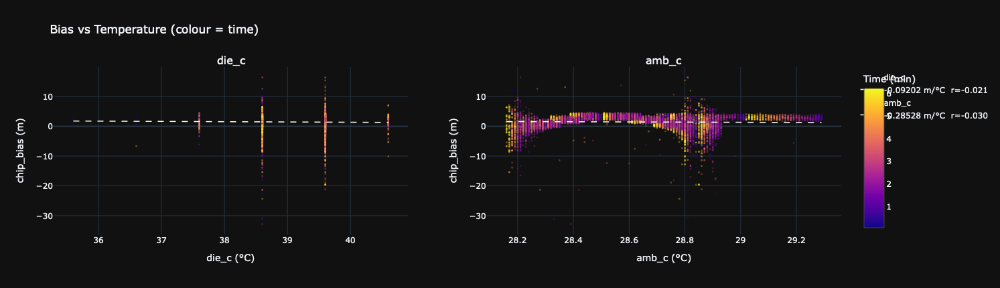

In [16]:
# ── Bias vs temperature ───────────────────────────────────────────────────────
TEMP = [(c, clr) for c, clr in [('die_c','tomato'),('amb_c','mediumpurple')]
        if c in VARY]

if not TEMP:
    print("No varying temperature columns — skipping")
else:
    fig = make_subplots(rows=1, cols=len(TEMP),
        subplot_titles=[c for c, _ in TEMP])
    for i, (col, clr) in enumerate(TEMP, 1):
        v = df[[col, 'raw_m', 'chip_bias', 't_min']].dropna()
        fig.add_trace(go.Scatter(
            x=v[col], y=v['chip_bias'],
            mode='markers',
            marker=dict(size=3, opacity=0.35,
                        color=v['t_min'], colorscale='Plasma',
                        showscale=(i==1), colorbar=dict(title='Time (min)')),
            name=col), row=1, col=i)
        z = np.polyfit(v[col], v['chip_bias'], 1)
        r = np.corrcoef(v[col], v['chip_bias'])[0, 1]
        xf = np.linspace(v[col].min(), v[col].max(), 50)
        fig.add_trace(go.Scatter(
            x=xf, y=np.polyval(z, xf),
            mode='lines', line=dict(color='white', dash='dash', width=1.5),
            name=f'{z[0]:.5f} m/°C  r={r:.3f}'), row=1, col=i)
        fig.update_xaxes(title_text=f'{col} (°C)', row=1, col=i)
        fig.update_yaxes(title_text='chip_bias (m)', row=1, col=i)
        print(f"{col}: chip_bias slope={z[0]:.5f} m/°C   r={r:.4f}")
    fig.update_layout(title='Bias vs Temperature (colour = time)',
        height=430, template='plotly_dark')
    fig.show()


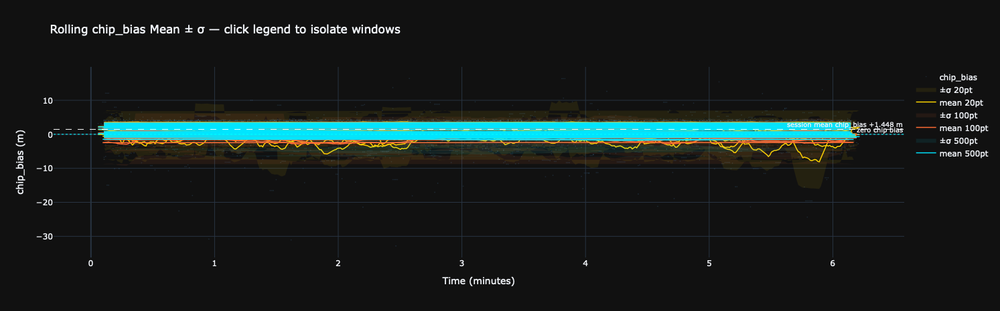

In [17]:
# ── Rolling mean / σ over time ────────────────────────────────────────────────
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['t_min'], y=df['chip_bias'],
    mode='markers', marker=dict(size=2, color='steelblue', opacity=0.2),
    name='chip_bias'))

for w, col in zip([20, 100, 500], ['#FFD700', '#FF6B35', '#00E5FF']):
    if len(df) <= w: continue
    rm = df['chip_bias'].rolling(w, center=True).mean()
    rs = df['chip_bias'].rolling(w, center=True).std()
    t  = df['t_min']
    rgba = col.lstrip('#')
    r_, g_, b_ = int(rgba[0:2],16), int(rgba[2:4],16), int(rgba[4:6],16)
    fig.add_trace(go.Scatter(
        x=pd.concat([t, t.iloc[::-1]]),
        y=pd.concat([rm+rs, (rm-rs).iloc[::-1]]),
        fill='toself', fillcolor=f'rgba({r_},{g_},{b_},0.08)',
        line=dict(color='rgba(0,0,0,0)'),
        name=f'±σ {w}pt'))
    fig.add_trace(go.Scatter(x=t, y=rm,
        mode='lines', line=dict(color=col, width=1.5),
        name=f'mean {w}pt'))

fig.add_hline(y=μb, line_dash='dash', line_color='white', line_width=1,
    annotation_text=f'session mean chip_bias {μb:+.3f} m', annotation_font_size=10)
fig.add_hline(y=0, line_dash='dot', line_color='cyan', line_width=1,
    annotation_text='zero chip bias', annotation_font_size=10)
fig.update_layout(
    title='Rolling chip_bias Mean ± σ — click legend to isolate windows',
    xaxis_title='Time (minutes)', yaxis_title='chip_bias (m)',
    height=450, template='plotly_dark',
    legend=dict(x=1.01, y=1, xanchor='left'))
fig.show()


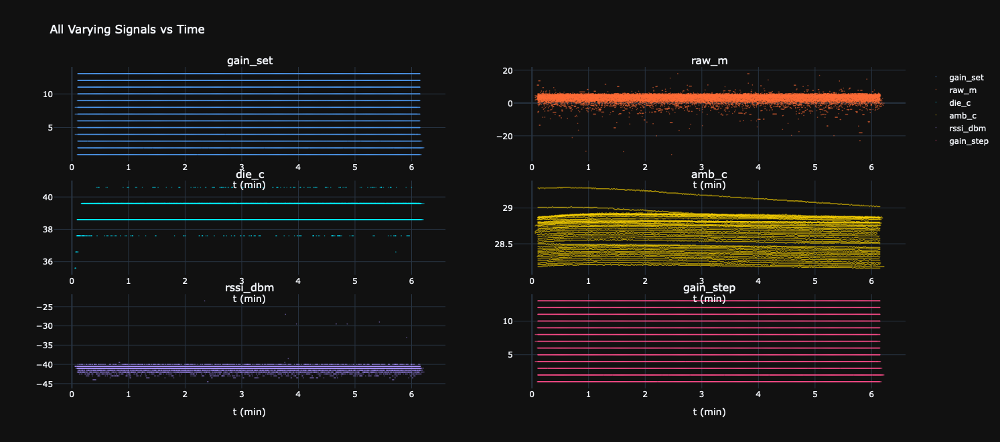

In [18]:
# ── All varying signals dashboard ─────────────────────────────────────────────
PAL = ['#4E9AF1','#FF6B35','#00E5FF','#FFD700','#A28BFA','#FF4C8B','#00C49A','#FF9F1C']
n, ncol = len(VARY), 2
nrow = max(1, (n + 1) // ncol)

fig = make_subplots(rows=nrow, cols=ncol, subplot_titles=VARY,
    vertical_spacing=0.06, horizontal_spacing=0.08)

for i, col in enumerate(VARY):
    r, c = i // ncol + 1, i % ncol + 1
    fig.add_trace(go.Scatter(
        x=df['t_min'], y=df[col],
        mode='markers', marker=dict(size=2, opacity=0.5, color=PAL[i % len(PAL)]),
        name=col), row=r, col=c)
    fig.update_xaxes(title_text='t (min)', row=r, col=c)

fig.update_layout(title='All Varying Signals vs Time',
    height=max(300, 220*nrow), template='plotly_dark')
fig.show()
